# Análisis y Predicción de Rendimiento en Pruebas Saber Pro


## Introducción
Las Pruebas Saber Pro son exámenes estandarizados administrados en Colombia para evaluar la calidad y el nivel de conocimiento y competencias de los estudiantes de educación superior. Estas pruebas, que abarcan cinco componentes genéricos (Inglés, Lectura Crítica, Competencias Ciudadanas, Razonamiento Cuantitativo y Comunicación Escrita), son fundamentales para los esfuerzos del Gobierno colombiano en monitorear y mejorar la calidad de la educación superior en el país.

## Objetivo del proyecto
El objetivo principal de este proyecto es desarrollar un modelo de clasificación que prediga el desempeño de cada estudiante en las Pruebas Saber Pro, categorizándolo como bajo, medio-bajo, medio-alto o alto.

## Enfoque Actual: Limpieza y Pre-prosesamiento de Datos

En esta etapa del proyecto, nos centraremos en dos aspectos críticos:

Limpieza de Datos: Prepararemos el conjunto de datos para el análisis, abordando problemas como valores faltantes, outliers y formatos inconsistentes.
Selección de Variables: Identificaremos las variables más relevantes para predecir la columna RENDIMIENTO_GLOBAL. Este proceso implica el análisis de las características disponibles y la selección de aquellas que ofrezcan el mayor poder predictivo.

## Estructura del Notebook

Este notebook guiará a través del proceso de limpieza de datos y selección de variables, sentando las bases para el desarrollo del modelo predictivo. Las secciones incluirán:

- Carga y exploración inicial de datos
- Limpieza de datos
- Resultados de la limpieza y preprocesamiento de datos

# Limpieza y Pre-procesamiento de los datos

## Carga y exploración inicial de datos

### Instalación de librerias necesarias

In [1]:
!wget --no-cache -O init.py -q https://raw.githubusercontent.com/rramosp/ai4eng.v1/main/content/init.py
import init; init.init(force_download=False); init.get_weblink()

### Carga del dataset desde Kaggle

In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '.'
!chmod 600 ./kaggle.json
!kaggle competitions download -c udea-ai4eng-20242

 75% 15.0M/20.1M [00:00<00:00, 155MB/s]
100% 20.1M/20.1M [00:00<00:00, 111MB/s]


### Descomprimir data


In [3]:
!unzip udea*.zip > /dev/null

In [4]:
!wc *.csv

   296787    296787   4716673 submission_example.csv
   296787   4565553  50135751 test.csv
   692501  10666231 118025055 train.csv
  1286075  15528571 172877479 total


### Instalaciones e importaciones

In [5]:
!pip install fuzzywuzzy
!pip install python-Levenshtein
!pip install pandas scikit-learn fuzzywuzzy
!pip install ydata-profiling

In [6]:
import re
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from fuzzywuzzy import fuzz
from collections import defaultdict
from ydata_profiling import ProfileReport
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LogisticRegression



### Exploración del dataset


#### Visualización de la data de entrenamiento

In [7]:
z = pd.read_csv("train.csv")
print ("shape of loaded dataframe", z.shape)

shape of loaded dataframe (692500, 12)


In [8]:
z.head()

,ID,PERIODO,ESTU_PRGM_ACADEMICO,ESTU_PRGM_DEPARTAMENTO,ESTU_VALORMATRICULAUNIVERSIDAD,ESTU_HORASSEMANATRABAJA,FAMI_ESTRATOVIVIENDA,FAMI_TIENEINTERNET,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,ESTU_PAGOMATRICULAPROPIO,RENDIMIENTO_GLOBAL
0,904256,20212,ENFERMERIA,BOGOTÁ,Entre 5.5 millones y menos de 7 millones,Menos de 10 horas,Estrato 3,Si,Técnica o tecnológica incompleta,Postgrado,No,medio-alto
1,645256,20212,DERECHO,ATLANTICO,Entre 2.5 millones y menos de 4 millones,0,Estrato 3,No,Técnica o tecnológica completa,Técnica o tecnológica incompleta,No,bajo
2,308367,20203,MERCADEO Y PUBLICIDAD,BOGOTÁ,Entre 2.5 millones y menos de 4 millones,Más de 30 horas,Estrato 3,Si,Secundaria (Bachillerato) completa,Secundaria (Bachillerato) completa,No,bajo
3,470353,20195,ADMINISTRACION DE EMPRESAS,SANTANDER,Entre 4 millones y menos de 5.5 millones,0,Estrato 4,Si,No sabe,Secundaria (Bachillerato) completa,No,alto
4,989032,20212,PSICOLOGIA,ANTIOQUIA,Entre 2.5 millones y menos de 4 millones,Entre 21 y 30 horas,Estrato 3,Si,Primaria completa,Primaria completa,No,medio-bajo


#### Tipos de datos por columna


Conocer el tipo de dato en cada columna de un conjunto de datos es fundamental para determinar cómo procesar y analizar la información de manera efectiva. Los tipos de datos, como enteros, flotantes, cadenas o booleanos, influyen en las operaciones que se pueden realizar, la forma en que se almacenan y se manejan los datos, y el tipo de análisis que se puede llevar a cabo. Por ejemplo, las columnas numéricas permiten realizar cálculos y estadísticas, mientras que las columnas de texto pueden requerir técnicas de procesamiento de lenguaje natural. Al entender los tipos de datos, se pueden aplicar las transformaciones adecuadas, optimizar el rendimiento y evitar errores en el análisis posterior.

In [10]:

print("Tipos de datos por columna:")
display(z.dtypes)


Tipos de datos por columna:


,0
ID,int64
PERIODO,int64
ESTU_PRGM_ACADEMICO,object
ESTU_PRGM_DEPARTAMENTO,object
ESTU_VALORMATRICULAUNIVERSIDAD,object
ESTU_HORASSEMANATRABAJA,object
FAMI_ESTRATOVIVIENDA,object
FAMI_TIENEINTERNET,object
FAMI_EDUCACIONPADRE,object
FAMI_EDUCACIONMADRE,object


El tipo de dato object indica que esas columnas contienen cadenas de texto (strings), pero podría haber errores de formato o datos numéricos almacenados como texto que se traduciran a Nan o none alterando la data.

#### Resumen estadistico para variables númericas


El resumen estadístico nos proporciona una visión general de las características numéricas de nuestro conjunto de datos. Utilizaremos la función describe() de pandas para generar este resumen, que incluirá las siguientes métricas para cada variable numérica:

-  Count: Número de valores no nulos
- Mean: Promedio de los valores
- Std: Desviación estándar
- Min: Valor mínimo
- 25%: Primer cuartil (percentil 25)
- 50%: Mediana (percentil 50)
- 75%: Tercer cuartil (percentil 75)
- Max: Valor máximo

Este resumen nos ayudará a identificar rápidamente patrones, outliers potenciales y la dispersión de nuestros datos númericos.

In [ ]:
print("Resumen estadístico de variables numéricas:")
display(z.describe())

Resumen estadístico de variables numéricas:


,ID,PERIODO
count,692500.000000,692500.000000
mean,494606.130576,20198.366679
std,285585.209455,10.535037
min,1.000000,20183.000000
25%,247324.750000,20195.000000
50%,494564.500000,20195.000000
75%,741782.500000,20203.000000
max,989286.000000,20213.000000


#### Análisis de los datos Categoricos


In [12]:
columnas = [
    'ID', 'PERIODO', 'ESTU_PRGM_ACADEMICO', 'ESTU_PRGM_DEPARTAMENTO',
    'ESTU_VALORMATRICULAUNIVERSIDAD', 'ESTU_HORASSEMANATRABAJA',
    'FAMI_ESTRATOVIVIENDA', 'FAMI_TIENEINTERNET', 'FAMI_EDUCACIONPADRE',
    'FAMI_EDUCACIONMADRE', 'ESTU_PAGOMATRICULAPROPIO', 'RENDIMIENTO_GLOBAL'
]

#####  Valores únicos y duplicados

La visualización de los valores únicos en cada columna es una práctica fundamental en la exploración inicial de datos. Este análisis nos permite comprender rápidamente la variabilidad y la naturaleza de la información en cada campo.

In [13]:

tabla_valores = pd.DataFrame({
    'Columna': columnas,
    'Valores_Unicos': [z[col].nunique() for col in columnas],
})

tabla_valores.reset_index(drop=True, inplace=True)

markdown_tabla = tabla_valores.to_markdown()

print(markdown_tabla)

|    | Columna                        |   Valores_Unicos |
|---:|:-------------------------------|-----------------:|
|  0 | ID                             |           692500 |
|  1 | PERIODO                        |                9 |
|  2 | ESTU_PRGM_ACADEMICO            |              948 |
|  3 | ESTU_PRGM_DEPARTAMENTO         |               31 |
|  4 | ESTU_VALORMATRICULAUNIVERSIDAD |                8 |
|  5 | ESTU_HORASSEMANATRABAJA        |                5 |
|  6 | FAMI_ESTRATOVIVIENDA           |                7 |
|  7 | FAMI_TIENEINTERNET             |                2 |
|  8 | FAMI_EDUCACIONPADRE            |               12 |
|  9 | FAMI_EDUCACIONMADRE            |               12 |
| 10 | ESTU_PAGOMATRICULAPROPIO       |                2 |
| 11 | RENDIMIENTO_GLOBAL             |                4 |


**ESTU_PRGM_ACADEMICO (948 valores únicos**): esta alta cantidad de valores únicos podría indicar inconsistencias, duplicados o errores en la entrada de datos. Es importante revisar si todos estos programas académicos son válidos y están correctamente registrados al igual que los demás.

##### Valores nulos y Nan por columna

El análisis de valores **nulos y NaN** es esencial para evaluar la calidad e integridad del dataset, identificando problemas de recolección de datos y guiando decisiones de preprocesamiento como la imputación o eliminación de valores faltantes. Además, permite anticipar posibles sesgos en el análisis y modelos posteriores.

In [14]:
tabla_nulls = pd.DataFrame({
    'Columna': columnas,
    'Valores_NA': z[columnas].isna().sum().values
})


total_datos = 692500


tabla_nulls['Porcentaje'] = (tabla_nulls['Valores_NA'] / total_datos) * 100


markdown_tabla = tabla_nulls.to_markdown()

print(markdown_tabla)


|    | Columna                        |   Valores_NA |   Porcentaje |
|---:|:-------------------------------|-------------:|-------------:|
|  0 | ID                             |            0 |     0        |
|  1 | PERIODO                        |            0 |     0        |
|  2 | ESTU_PRGM_ACADEMICO            |            0 |     0        |
|  3 | ESTU_PRGM_DEPARTAMENTO         |            0 |     0        |
|  4 | ESTU_VALORMATRICULAUNIVERSIDAD |         6287 |     0.90787  |
|  5 | ESTU_HORASSEMANATRABAJA        |        30857 |     4.45588  |
|  6 | FAMI_ESTRATOVIVIENDA           |        32137 |     4.64072  |
|  7 | FAMI_TIENEINTERNET             |        26629 |     3.84534  |
|  8 | FAMI_EDUCACIONPADRE            |        23178 |     3.347    |
|  9 | FAMI_EDUCACIONMADRE            |        23664 |     3.41718  |
| 10 | ESTU_PAGOMATRICULAPROPIO       |         6498 |     0.938339 |
| 11 | RENDIMIENTO_GLOBAL             |            0 |     0        |


La presencia de valores nulos o NaN en ninguna columna superan el 5% del total, saber esto es crucial, ya que permite tomar decisiones más informadas sobre cómo manejar dichos valores. En estos casos, es común optar por la imputación de valores o incluso la eliminación de las filas afectadas, dado que el impacto en el análisis será mínimo, asegurando la calidad de los datos sin comprometer la integridad del modelo.

#### Revisión de valores unicos en las columnas

In [15]:
for column in z.columns:
    print(f"Frecuencia de valores en la columna '{column}':")
    print(z[column].value_counts())
    print("\n")

Frecuencia de valores en la columna 'ID':
ID
904256    1
915348    1
373660    1
691058    1
790510    1
         ..
190471    1
882806    1
297614    1
540154    1
933374    1
Name: count, Length: 692500, dtype: int64


Frecuencia de valores en la columna 'PERIODO':
PERIODO
20195    180873
20203    171838
20212    171412
20183    164818
20194      1472
20213      1178
20202       490
20184       254
20196       165
Name: count, dtype: int64


Frecuencia de valores en la columna 'ESTU_PRGM_ACADEMICO':
ESTU_PRGM_ACADEMICO
DERECHO                                                   53244
ADMINISTRACION DE EMPRESAS                                51902
CONTADURIA PUBLICA                                        39664
PSICOLOGIA                                                31932
INGENIERIA INDUSTRIAL                                     28481
                                                          ...  
LICENCIATURA EN ESPAÑOL Y FILOLOGÍA                           1
ADMINISTRACION EN NEGOCIO

Luego de hacer esto podemos notar que salvo ESTU_PRGM_ACADEMICO no hay columnas que cuenten con valores únicos que se consideren problematicos.

## Limpieza de datos


### Eliminación de columnas inaportantes

#### Eliminación de columnas basadas en la correlación con la variable de interes RENDIMIENTO_GLOBAL

Al eliminar estas columnas, se optimiza el dataset, mejorando la eficiencia de los algoritmos de análisis y evitando sesgos en los modelos, lo que a su vez contribuye a obtener resultados más precisos y confiables.

In [17]:
profile = ProfileReport(z, title='Informe EDA', explorative=True)
profile.to_file("eda_report.html")
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:533: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

**Variables con Baja Correlación:**

- ESTU_HORASSEMANATRABAJA: 0.0988 (correlación baja).
- FAMI_TIENEINTERNET: 0.1479 (correlación baja).
- PERIODO: 0.0487 (correlación baja).

Estas variables tienen correlaciones muy bajas con RENDIMIENTO_GLOBAL, lo que sugiere que pueden ser inaportantes para tu modelo.

Variables con Correlación Moderada:

- ESTU_PAGOMATRICULAPROPIO: 0.2013 (correlación moderada).
- ESTU_PRGM_DEPARTAMENTO: 0.1153 (correlación moderada).
- FAMI_EDUCACIONMADRE: 0.1762 (correlación moderada).
- FAMI_EDUCACIONPADRE: 0.1698 (correlación moderada).
- FAMI_ESTRATOVIVIENDA: 0.1658 (correlación moderada).
- ESTU_VALORMATRICULAUNIVERSIDAD: 0.2175 (correlación moderada)

A pesar de que algunas correlaciones son muy bajas se elije no eliminar  algunas. Se eliminan las columnas que se consideran inaportantes para predecir la variable de interes sin importar el valor de la correlación.

In [18]:
z = z.drop(columns=['ID'])
z = z.drop(columns=['ESTU_PAGOMATRICULAPROPIO'])
z = z.drop(columns=['ESTU_VALORMATRICULAUNIVERSIDAD'])
z = z.drop(columns=['PERIODO'])

#### Elección de columnas a eliminar basado en valores Nan

Eliminar columnas con un porcentaje de valores **NaN superior al 70%** en un dataset es una práctica común en la limpieza de datos, ya que indica que la mayoría de los datos en esa columna están ausentes. Esto puede comprometer la calidad y la integridad del análisis posterior, ya que un alto porcentaje de datos faltantes sugiere que la columna puede no ser representativa o útil para los objetivos del estudio.

In [19]:
null_percentage = z.isnull().mean() * 100

high_null_columns = null_percentage[null_percentage > 70]

print("Columnas con más del 70% de valores nulos:")
print(high_null_columns)

Columnas con más del 70% de valores nulos:
Series([], dtype: float64)


No hay porcentajes demasiado significativos en las columnas con valores null para ser eliminadas por este criterio

### Conversión variables categoricas a numericas y reemplazo de datos y Nan

Una **variable categórica** es aquella que representa diferentes categorías o grupos. Dentro de las variables categóricas, existen dos tipos principales:

- Variable categórica nominal:
  Representa categorías sin un orden intrínseco. No hay una jerarquía entre las categorías.
  Ejemplos: Colores (rojo, azul, verde), ciudades (Bogotá, Lima, Madrid).

- Variable categórica ordinal:
  Representa categorías que sí tienen un orden o jerarquía entre ellas, pero las diferencias entre los niveles no son cuantificables.
  Ejemplos: Niveles de satisfacción (bajo, medio, alto), grados académicos (secundaria, licenciatura, maestría).


Para convertir **variables categóricas** en valores numéricos durante la limpieza y estandarización de datos, es importante considerar su tipo. **Las variables categóricas nominales,** al no tener un orden intrínseco, se transforman típicamente mediante **One-Hot Encoding**, que crea columnas binarias para cada categoría, o **Label Encoding** en casos binarios. Las **variables categóricas ordinales**, por su parte, siguen un orden lógico, por lo que se transforman usando Label Encoding, asignando un número que respete esa jerarquía. Esta distinción asegura que las transformaciones numéricas representen adecuadamente la naturaleza de las categorías en el análisis posterior.

**Dentro del dataset en variables categoricas ordinales que quedan tenemos**
- FAMI_EDUCACIONPADRE, FAMI_EDUCACIONPADRE, RENDIMIENTO_GLOBAL,  FAMI_ESTRATOVIVIENDA, ESTU_HORASSEMANATRABAJA

**Dentro del dataset en variables categoricas nominales que quedan tenemos**
- FAMI_TIENEINTERNET, ESTU_PRGM_ACADEMICO , ESTU_PRGM_DEPARTAMENTO

##### Funciones

In [20]:
def replace_nans_equilibrado(df, column_name):
    """
    Reemplaza los valores NaN de una columna con otros valores de la misma columna
    de manera proporcional a su frecuencia.

    :param df: DataFrame que contiene la columna.
    :param column_name: Nombre de la columna donde se reemplazarán los NaN.
    :return: DataFrame con los NaN reemplazados de manera equilibrada.
    """
    values, counts = np.unique(df[column_name].dropna(), return_counts=True)

    probabilities = counts / counts.sum()

    df[column_name] = df[column_name].apply(
        lambda x: np.random.choice(values, p=probabilities) if pd.isna(x) else x
    )

    return df

In [21]:
def contar_nulos(df, column_name):
    null_count = df[column_name].isnull().sum()
    print(f'Total de valores nulos en {column_name}: {null_count}')


In [22]:
def label_encode_column(df, column_name):
    """
    Aplica Label Encoding a una columna de un DataFrame, transformando los valores categóricos en numéricos.

    :param df: DataFrame que contiene la columna.
    :param column_name: Nombre de la columna a codificar.
    :return: DataFrame con la columna codificada y el codificador.
    """

    le = LabelEncoder()

    df[column_name] = le.fit_transform(df[column_name])

    mapping_df = pd.DataFrame({
        'Categoría Original': le.classes_,
        'Valor Numérico': le.transform(le.classes_)
    })

    print(f'Mapeo de categorías en la columna {column_name}:')
    print(mapping_df.to_markdown(index=False))


    return df, mapping_df


In [23]:
def one_hot_encode_column(df, column_name):
    """
    Aplica One-Hot Encoding a una columna categórica de un DataFrame y devuelve el DataFrame transformado.

    :param df: DataFrame que contiene la columna.
    :param column_name: Nombre de la columna a codificar.
    :return: DataFrame con la columna codificada usando One-Hot Encoding.
    """
    one_hot_encoded_df = pd.get_dummies(df, columns=[column_name], prefix=column_name, drop_first=True)

    one_hot_encoded_df = one_hot_encoded_df.astype(int)

    return one_hot_encoded_df

In [24]:
def eliminar_filas_nan(df, columna):
    """
    Elimina filas del DataFrame si la columna especificada tiene NaN,
    siempre y cuando el porcentaje de NaN en esa columna no supere el 5%.

    Args:
        df (pd.DataFrame): El DataFrame del que se eliminarán las filas.
        columna (str): El nombre de la columna a evaluar.

    Returns:
        pd.DataFrame: El DataFrame resultante después de eliminar las filas.
    """

    porcentaje_nan = df[columna].isna().mean() * 100

    if porcentaje_nan <= 5:
        df = df.dropna(subset=[columna])
        print(f"Se eliminaron filas de la columna '{columna}' con NaN. Porcentaje de NaN: {porcentaje_nan:.2f}%")
    else:
        print(f"No se eliminan filas. El porcentaje de NaN en la columna '{columna}' es {porcentaje_nan:.2f}%, mayor al 5%.")

    return df

In [25]:
def encontrar_palabras_extranas(df, columna):
    patron = r'[^\w\s]| {2,}'
    palabras_extranas = set()

    for texto in df[columna]:
        if pd.notna(texto):
            palabras_extranas.update([palabra for palabra in texto.split() if re.search(patron, palabra)])

    return list(palabras_extranas)


In [26]:
def limpiar_columna(df, columna):
    reemplazo_vocales = {
        'á': 'a',
        'é': 'e',
        'í': 'i',
        'ó': 'o',
        'ú': 'u',
        'ü': 'u',
        'ñ': 'n',
        '&': 'y'
    }


    df[columna] = df[columna].str.lower()

    df[columna] = df[columna].replace(reemplazo_vocales, regex=True)
    df[columna] = df[columna].replace(r"[,&\-:+'*\"\.()]+", ' ', regex=True)
    df[columna] = df[columna].replace(r'\s+', ' ', regex=True).str.strip()

    return df

In [27]:

def agrupar_por_primera_palabra(valores, presicion):
    agrupados = defaultdict(list)

    for valor in valores:
        primera_palabra = valor.split()[0] if valor else ''
        clave_encontrada = False

        for clave in list(agrupados.keys()):
            if fuzz.ratio(primera_palabra, clave) > presicion:  # Umbral de similitud
                agrupados[clave].append(valor)
                clave_encontrada = True
                break

        if not clave_encontrada:
            agrupados[primera_palabra].append(valor)

    return dict(agrupados)


#### Categoricas Ordinales

##### Familia educación padre

In [28]:
z = limpiar_columna(z, 'FAMI_EDUCACIONPADRE')

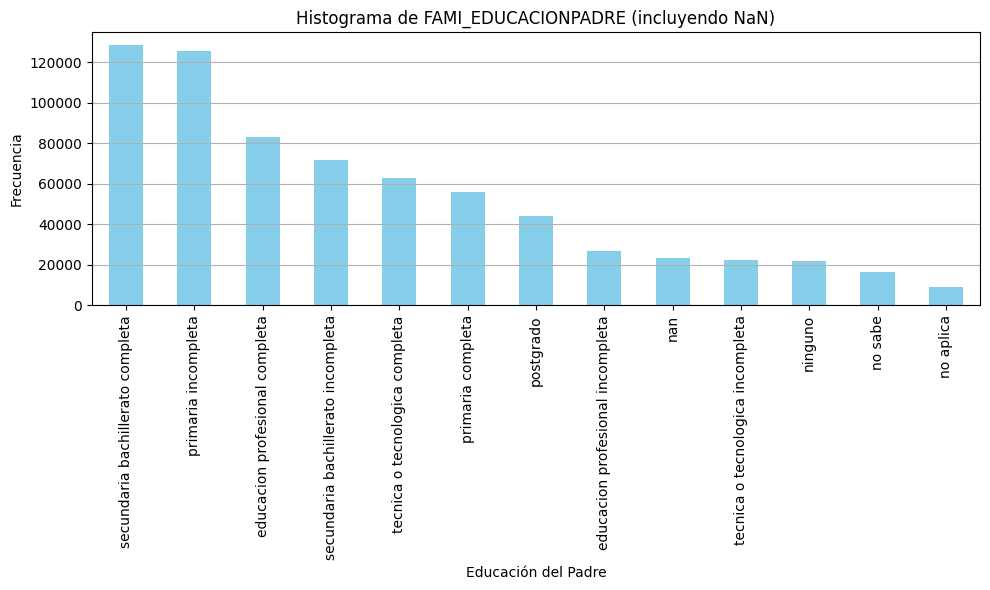

In [29]:
#histograma
plt.figure(figsize=(10, 6))
z['FAMI_EDUCACIONPADRE'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de FAMI_EDUCACIONPADRE (incluyendo NaN)')
plt.xlabel('Educación del Padre')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [30]:
contar_nulos(z,'FAMI_EDUCACIONPADRE')

Total de valores nulos en FAMI_EDUCACIONPADRE: 23178


In [31]:
z = eliminar_filas_nan(z, 'FAMI_EDUCACIONPADRE')
print(z['FAMI_EDUCACIONPADRE'].isnull().sum())

Se eliminaron filas de la columna 'FAMI_EDUCACIONPADRE' con NaN. Porcentaje de NaN: 3.35%
0


In [32]:
z.FAMI_EDUCACIONPADRE.value_counts()

,count
FAMI_EDUCACIONPADRE,
secundaria bachillerato completa,128289
primaria incompleta,125675
educacion profesional completa,83117
secundaria bachillerato incompleta,71654
tecnica o tecnologica completa,62995
primaria completa,55958
postgrado,44169
educacion profesional incompleta,27084
tecnica o tecnologica incompleta,22552


In [33]:
z, encoder_fami_educacionpadre= label_encode_column(z, 'FAMI_EDUCACIONPADRE' )

Mapeo de categorías en la columna FAMI_EDUCACIONPADRE:
| Categoría Original                 |   Valor Numérico |
|:-----------------------------------|-----------------:|
| educacion profesional completa     |                0 |
| educacion profesional incompleta   |                1 |
| ninguno                            |                2 |
| no aplica                          |                3 |
| no sabe                            |                4 |
| postgrado                          |                5 |
| primaria completa                  |                6 |
| primaria incompleta                |                7 |
| secundaria bachillerato completa   |                8 |
| secundaria bachillerato incompleta |                9 |
| tecnica o tecnologica completa     |               10 |
| tecnica o tecnologica incompleta   |               11 |


##### Familia educación madre

In [34]:
z = limpiar_columna(z, 'FAMI_EDUCACIONMADRE')

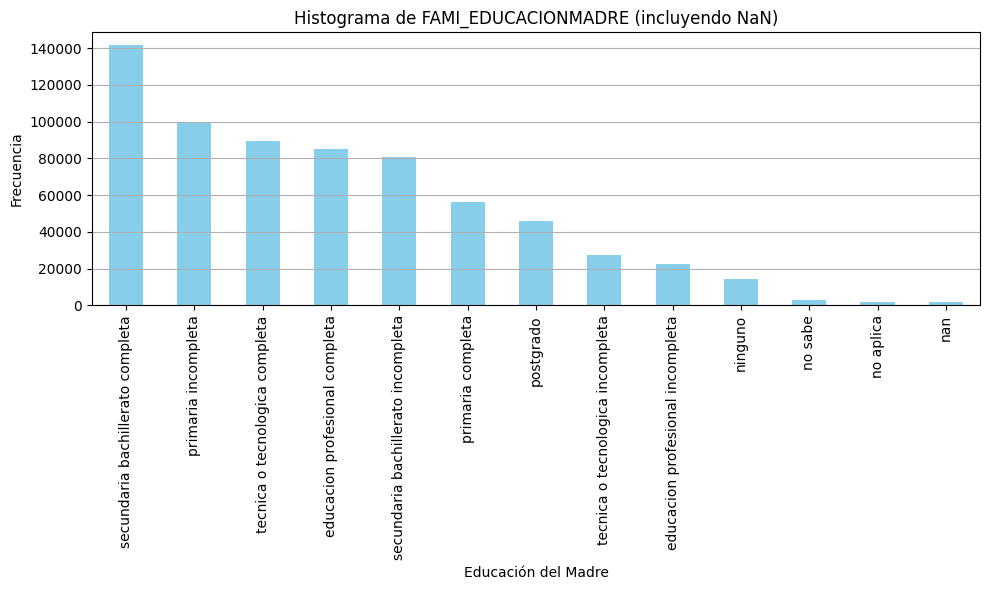

In [35]:
#histograma
plt.figure(figsize=(10, 6))
z['FAMI_EDUCACIONMADRE'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de FAMI_EDUCACIONMADRE (incluyendo NaN)')
plt.xlabel('Educación del Madre')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [36]:
contar_nulos(z,'FAMI_EDUCACIONMADRE')

Total de valores nulos en FAMI_EDUCACIONMADRE: 1681


In [37]:
z = eliminar_filas_nan(z, 'FAMI_EDUCACIONMADRE')
print(z['FAMI_EDUCACIONMADRE'].isnull().sum())

Se eliminaron filas de la columna 'FAMI_EDUCACIONMADRE' con NaN. Porcentaje de NaN: 0.25%
0


In [38]:
z.FAMI_EDUCACIONMADRE.value_counts()

,count
FAMI_EDUCACIONMADRE,
secundaria bachillerato completa,141532
primaria incompleta,99192
tecnica o tecnologica completa,89410
educacion profesional completa,85220
secundaria bachillerato incompleta,80897
primaria completa,56027
postgrado,46197
tecnica o tecnologica incompleta,27477
educacion profesional incompleta,22368


In [39]:
z, encoder_fami_educacionpadre= label_encode_column(z, 'FAMI_EDUCACIONMADRE' )

Mapeo de categorías en la columna FAMI_EDUCACIONMADRE:
| Categoría Original                 |   Valor Numérico |
|:-----------------------------------|-----------------:|
| educacion profesional completa     |                0 |
| educacion profesional incompleta   |                1 |
| ninguno                            |                2 |
| no aplica                          |                3 |
| no sabe                            |                4 |
| postgrado                          |                5 |
| primaria completa                  |                6 |
| primaria incompleta                |                7 |
| secundaria bachillerato completa   |                8 |
| secundaria bachillerato incompleta |                9 |
| tecnica o tecnologica completa     |               10 |
| tecnica o tecnologica incompleta   |               11 |


##### Rendimiento global

In [40]:
z = limpiar_columna(z, 'RENDIMIENTO_GLOBAL')

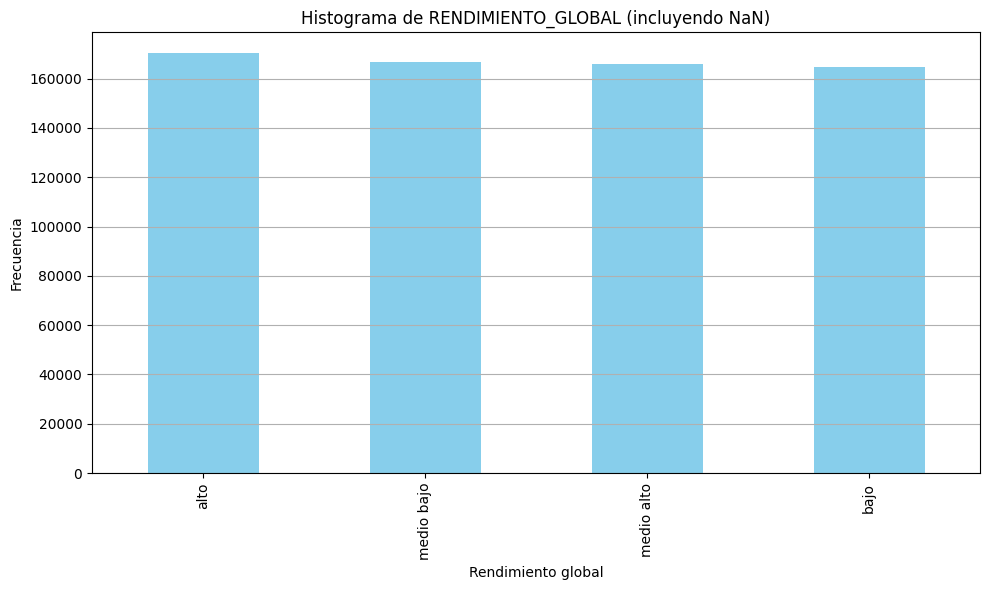

In [41]:
#histograma
plt.figure(figsize=(10, 6))
z['RENDIMIENTO_GLOBAL'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de RENDIMIENTO_GLOBAL (incluyendo NaN)')
plt.xlabel('Rendimiento global')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [42]:
z.RENDIMIENTO_GLOBAL.value_counts()

,count
RENDIMIENTO_GLOBAL,
alto,170271
medio bajo,166729
medio alto,165989
bajo,164652


In [43]:
z, encoder_rendi_global= label_encode_column(z, 'RENDIMIENTO_GLOBAL' )


Mapeo de categorías en la columna RENDIMIENTO_GLOBAL:
| Categoría Original   |   Valor Numérico |
|:---------------------|-----------------:|
| alto                 |                0 |
| bajo                 |                1 |
| medio alto           |                2 |
| medio bajo           |                3 |


##### Familia estrato vivienda

In [44]:
z = limpiar_columna(z, 'FAMI_ESTRATOVIVIENDA')

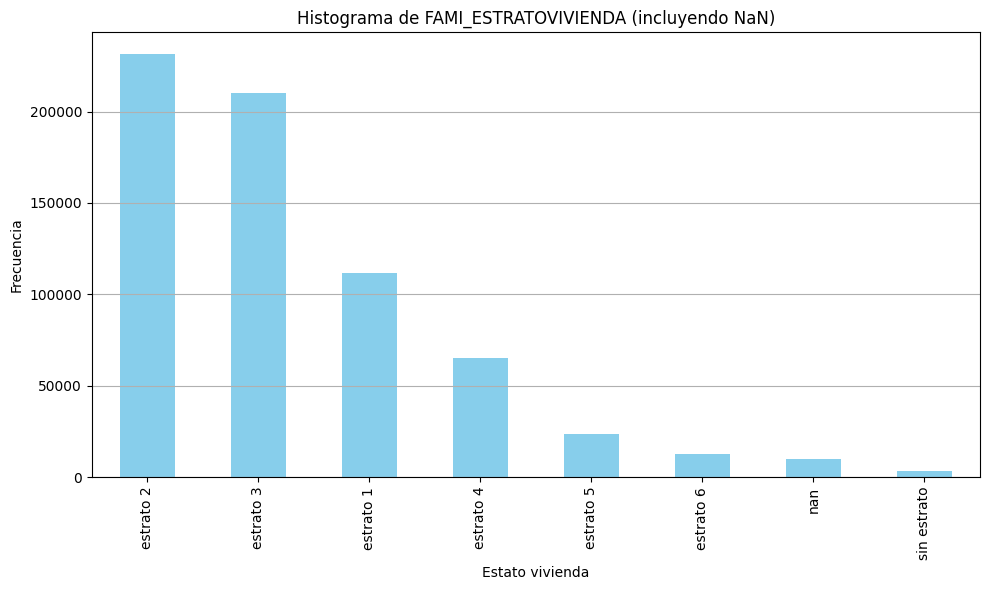

In [45]:
#histograma
plt.figure(figsize=(10, 6))
z['FAMI_ESTRATOVIVIENDA'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de FAMI_ESTRATOVIVIENDA (incluyendo NaN)')
plt.xlabel('Estato vivienda')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [46]:
contar_nulos(z,'FAMI_ESTRATOVIVIENDA')

Total de valores nulos en FAMI_ESTRATOVIVIENDA: 9917


In [47]:
z = eliminar_filas_nan(z, 'FAMI_ESTRATOVIVIENDA')
print(z['FAMI_ESTRATOVIVIENDA'].isnull().sum())

Se eliminaron filas de la columna 'FAMI_ESTRATOVIVIENDA' con NaN. Porcentaje de NaN: 1.49%
0


In [48]:
z.FAMI_ESTRATOVIVIENDA.value_counts()

,count
FAMI_ESTRATOVIVIENDA,
estrato 2,231752
estrato 3,209905
estrato 1,111434
estrato 4,65307
estrato 5,23521
estrato 6,12572
sin estrato,3233


In [49]:
z, encoder_fami_estactovivienda= label_encode_column(z, 'FAMI_ESTRATOVIVIENDA' )

Mapeo de categorías en la columna FAMI_ESTRATOVIVIENDA:
| Categoría Original   |   Valor Numérico |
|:---------------------|-----------------:|
| estrato 1            |                0 |
| estrato 2            |                1 |
| estrato 3            |                2 |
| estrato 4            |                3 |
| estrato 5            |                4 |
| estrato 6            |                5 |
| sin estrato          |                6 |


##### Horas semanales trabajadas

In [50]:
z = limpiar_columna(z, 'ESTU_HORASSEMANATRABAJA')

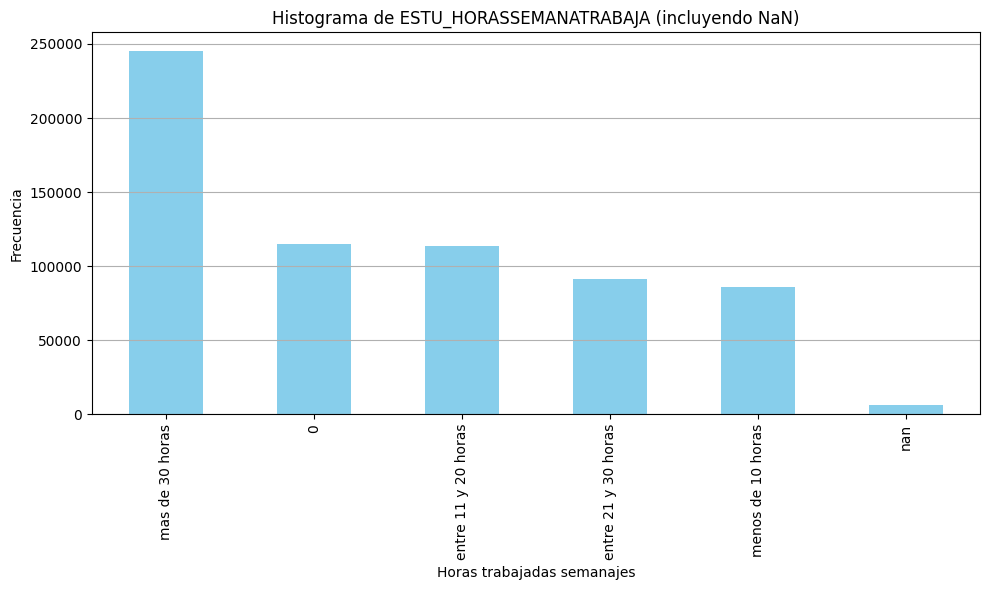

In [51]:
#histograma
plt.figure(figsize=(10, 6))
z['ESTU_HORASSEMANATRABAJA'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de ESTU_HORASSEMANATRABAJA (incluyendo NaN)')
plt.xlabel('Horas trabajadas semanajes')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [52]:
contar_nulos(z,'ESTU_HORASSEMANATRABAJA')

Total de valores nulos en ESTU_HORASSEMANATRABAJA: 6549


In [53]:
z = eliminar_filas_nan(z, 'ESTU_HORASSEMANATRABAJA')
print(z['ESTU_HORASSEMANATRABAJA'].isnull().sum())

Se eliminaron filas de la columna 'ESTU_HORASSEMANATRABAJA' con NaN. Porcentaje de NaN: 1.00%
0


In [54]:
z.ESTU_HORASSEMANATRABAJA.value_counts()

,count
ESTU_HORASSEMANATRABAJA,
mas de 30 horas,245577
0,114802
entre 11 y 20 horas,113918
entre 21 y 30 horas,91079
menos de 10 horas,85799


In [55]:
cmap = {
    'mas de 30 horas': 35,               # Suponiendo un promedio de 35 horas
    '0': 0,
    'entre 11 y 20 horas': 15.5,         # Promedio de 11 a 20 horas
    'entre 21 y 30 horas': 25.5,         # Promedio de 21 a 30 horas
    'menos de 10 horas': 5,              # Suponiendo un promedio de menos de 10 horas
}


z.ESTU_HORASSEMANATRABAJA = np.r_[[cmap[i] for i in z.ESTU_HORASSEMANATRABAJA]]


#### Categoricas Nominales

##### Departamento estudiante

In [56]:
z = limpiar_columna(z, 'ESTU_PRGM_DEPARTAMENTO')

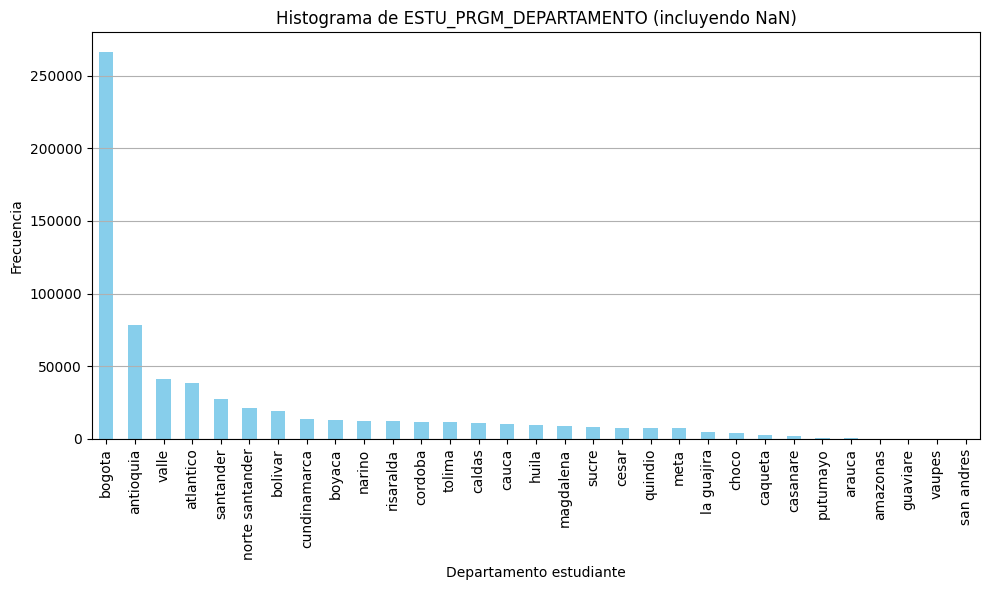

In [57]:
#histograma
plt.figure(figsize=(10, 6))
z['ESTU_PRGM_DEPARTAMENTO'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de ESTU_PRGM_DEPARTAMENTO (incluyendo NaN)')
plt.xlabel('Departamento estudiante')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [58]:
z.ESTU_PRGM_DEPARTAMENTO.value_counts()

,count
ESTU_PRGM_DEPARTAMENTO,
bogota,266574
antioquia,78391
valle,41392
atlantico,38381
santander,27253
norte santander,21295
bolivar,19246
cundinamarca,13359
boyaca,13201


In [59]:
# Eliminar temporalmente las columnas 'FAMI_TIENEINTERNET' y 'RENDIMIENTO_GLOBAL'
# Para poder aplicar one hot encoder
z_dropped = z.drop(columns=['FAMI_TIENEINTERNET','ESTU_PRGM_ACADEMICO'])

z_encoded = one_hot_encode_column(z_dropped, 'ESTU_PRGM_DEPARTAMENTO')

z_encoded['FAMI_TIENEINTERNET'] = z['FAMI_TIENEINTERNET']
z_encoded['ESTU_PRGM_ACADEMICO'] = z['ESTU_PRGM_ACADEMICO']

z = z_encoded

##### Programa Academico

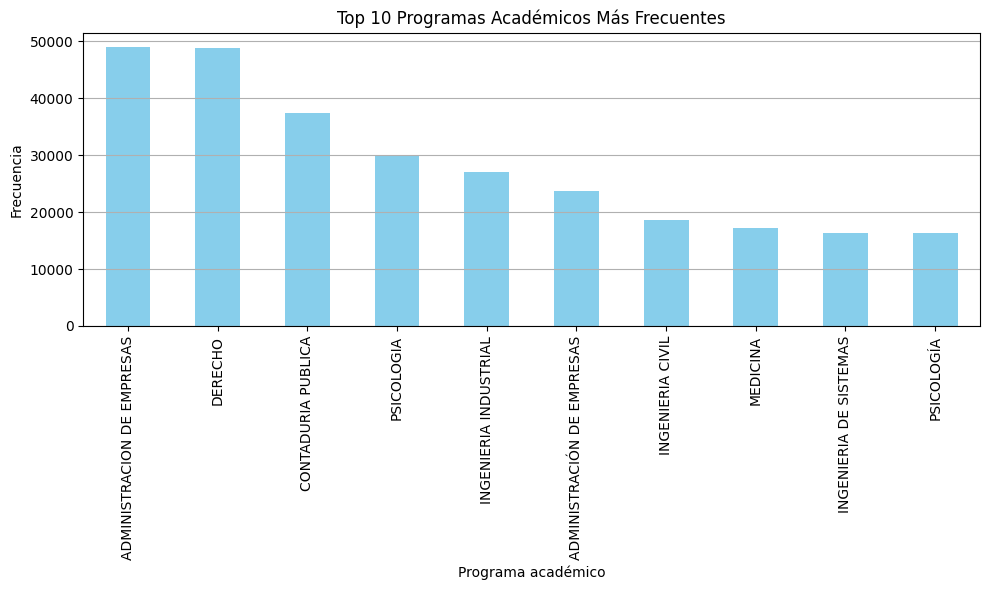

In [60]:
# 10 programas académicos más frecuentes
plt.figure(figsize=(10, 6))
z['ESTU_PRGM_ACADEMICO'].value_counts().head(10).plot(kind='bar', color='skyblue')
plt.title('Top 10 Programas Académicos Más Frecuentes')
plt.xlabel('Programa académico')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()



<ipython-input-61-e64bacd33ba1>:12: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


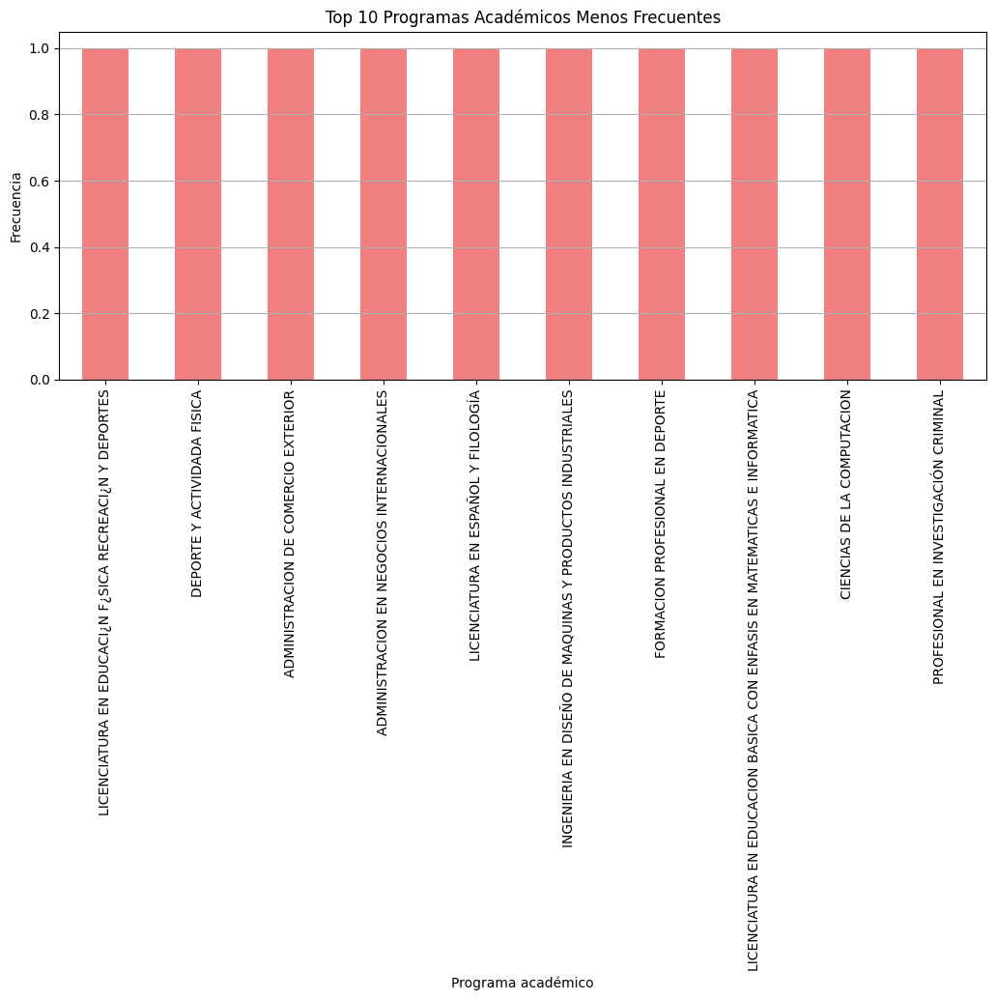

In [61]:
# 10 programas académicos menos frecuentes
plt.figure(figsize=(12, 6))
z['ESTU_PRGM_ACADEMICO'].value_counts().tail(10).plot(kind='bar', color='lightcoral')
plt.title('Top 10 Programas Académicos Menos Frecuentes')
plt.xlabel('Programa académico')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90, fontsize=10)
plt.grid(axis='y')

plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.3)

plt.tight_layout()
plt.show()

Al ser esta la columna con más datos únicos posiblemente tenga muchisimos errores orgotograficos que duplican valores que no deberían

Ejemplo:

quimicafarmaceutica, química farmacéutica, química farmaceutica, quimica farmacéutica

Que realmente son el mismo valor pero a causa de las tildes aparecen como cuatro únicos, por ellos procedemos a normalizar los datos de la columna eliminando tildes, diarisis, minúsculas, caracteres especiales como la ñ, comas, guiones, puntos, dos puntos, dobles espacios, comillas simples o dobles, etc.

In [62]:
z = limpiar_columna(z, 'ESTU_PRGM_ACADEMICO')

In [63]:
palabras_extranas = encontrar_palabras_extranas(z, 'ESTU_PRGM_ACADEMICO')
print("Palabras con caracteres extraños o múltiples espacios:", palabras_extranas)

Palabras con caracteres extraños o múltiples espacios: ['3°', 'qu¿mica', 'p¿blica', 'gastronom¿a', 'gesti¿n', 'matem¿ticas', 'administraci¿n', 'm¿sica', 'ingl¿s', 'farmac¿utica', 'esc¿nicas', '¿nfasis', 'dise¿¿o', 'b¿sica', 'comunicaci¿¿n', 'f¿sica', 'pedagog¿a', 'educaci¿n', 'geolog¿a', 'filosof¿a', 'gr¿¿fica', 'econom¿a', 'recreaci¿n', 'log¿stica', 'dise¿o', 'el¿ctrica', 'ingenier¿a', 'art¿stica', 'comunicaci¿n']


In [64]:

correcciones = {
    'b¿sica': 'basica',
    'pedagog¿a': 'pedagogia',
    'gastronom¿a': 'gastronomia',
    'farmac¿utica': 'farmaceutica',
    'ingl¿s': 'ingles',
    'filosof¿a': 'filosofia',
    'dise¿o': 'diseno',
    'f¿sica': 'fisica',
    'econom¿a': 'economia',
    'administraci¿n': 'administracion',
    'esc¿nicas': 'escenicas',
    'geolog¿a': 'geologia',
    '3°ciclo': '3 ciclo',
    'ingenier¿a': 'ingenieria',
    'm¿sica': 'musica',
    'publica.': 'publica',
    'p¿blica': 'publica',
    '¿nfasisi': 'enfasis',
    'matem¿ticas': 'matematicas',
    'el¿ctrica': 'electrica',
    'quimica.': 'quimica',
    'recreaci¿n': 'recreacion',
    'educaci¿n': 'educacion',
    'comunicaci¿n': 'comunicacion',
    'gesti¿n': 'gestion',
    'qu¿mica': 'quimica',
    'log¿stica': 'logistica',
    'dise¿¿o': 'diseno',
    'comunicaci¿¿n': 'comunicacion',
    'art¿stica': 'artistica',
    'gr¿¿fica': 'grafica',
    '3°': '3',
    '¿nfasis': 'enfasis'

}


z['ESTU_PRGM_ACADEMICO'] = z['ESTU_PRGM_ACADEMICO'].replace(correcciones, regex=True)

Dado que la columna contiene una gran cantidad de valores únicos, se procederá a agruparlos según áreas del conocimiento o programas académicos. Esto se debe a que las pruebas Saber Pro tienen un componente común a la carrera y otro específico. Para simplificar el análisis, nos enfocaremos en agrupar los datos de esta columna en función del componente común, ya que es más fácil de ordenar y estandarizar. Al hacer esto, podremos reducir la complejidad del conjunto de datos y mejorar la interpretación y comparabilidad de los resultados en contextos más amplios.

In [65]:
valores_academicos = z['ESTU_PRGM_ACADEMICO'].unique()

valores_agrupados = agrupar_por_primera_palabra(valores_academicos, 90)

valor_a_grupo = {}
for clave, grupo in valores_agrupados.items():
    if len(grupo) > 1:
        primera_palabra_grupo = clave.split()[0]
        for valor in grupo:
            valor_a_grupo[valor] = primera_palabra_grupo


z['GRUPO_PRGM_ACADEMICO'] = z['ESTU_PRGM_ACADEMICO'].map(valor_a_grupo)


z['GRUPO_PRGM_ACADEMICO'] = z['GRUPO_PRGM_ACADEMICO'].fillna(z['ESTU_PRGM_ACADEMICO'])


print(z[['ESTU_PRGM_ACADEMICO', 'GRUPO_PRGM_ACADEMICO']])

                        ESTU_PRGM_ACADEMICO GRUPO_PRGM_ACADEMICO
0                                enfermeria           enfermeria
1                                   derecho              derecho
2                     mercadeo y publicidad             mercadeo
3                administracion de empresas       administracion
4                                psicologia           psicologia
...                                     ...                  ...
692495                             biologia             biologia
692496                           psicologia           psicologia
692497  administracion en salud ocupacional       administracion
692498                           psicologia           psicologia
692499                           psicologia           psicologia

[651175 rows x 2 columns]


In [66]:
z['GRUPO_PRGM_ACADEMICO'].unique()

array(['enfermeria', 'derecho', 'mercadeo', 'administracion',
       'psicologia', 'medicina', 'ingenieria', 'hoteleria',
       'licenciatura', 'comunicacion', 'ciencia', 'profesional',
       'maestro en musica', 'trabajo social', 'contaduria', 'estadistica',
       'zootecnia', 'seguridad y salud en el trabajo', 'odontologia',
       'diseno', 'economia', 'negocios', 'quimicafarmaceutica',
       'finanzas', 'relaciones', 'instrumentacion', 'fisioterapia',
       'farmacia', 'arte', 'arquitectura', 'optometria', 'jurisprudencia',
       'estudios', 'nutricion y dietetica', 'terapia', 'filologia',
       'gerencia', 'traduccion ingles frances espanol', 'gestion',
       'planeacion y desarrollo social', 'entrenamiento deportivo',
       'biologia', 'filosofia', 'bacteriologia', 'sociologia',
       'periodismo', 'linguistica', 'antropologia', 'agronomia',
       'fonoaudiologia', 'lenguas', 'geologia', 'quimica', 'historia',
       'microbiologia', 'salud ocupacional', 'construccion'

In [67]:
#Reemplazamos ESTU_PRGM_ACADEMICO por GRUPO_PRGM_ACADEMICO
z = z.drop(columns=['ESTU_PRGM_ACADEMICO'])

In [68]:
#eliminar temporalmente familia tiene internet para
#poder hacer el one hot encoding
z_dropped = z.drop(columns=['FAMI_TIENEINTERNET'])

z_encoded = one_hot_encode_column(z_dropped, 'GRUPO_PRGM_ACADEMICO')
z_encoded['FAMI_TIENEINTERNET'] = z['FAMI_TIENEINTERNET']

z = z_encoded


##### Familia tiene internet

In [69]:
z = limpiar_columna(z, 'FAMI_TIENEINTERNET')


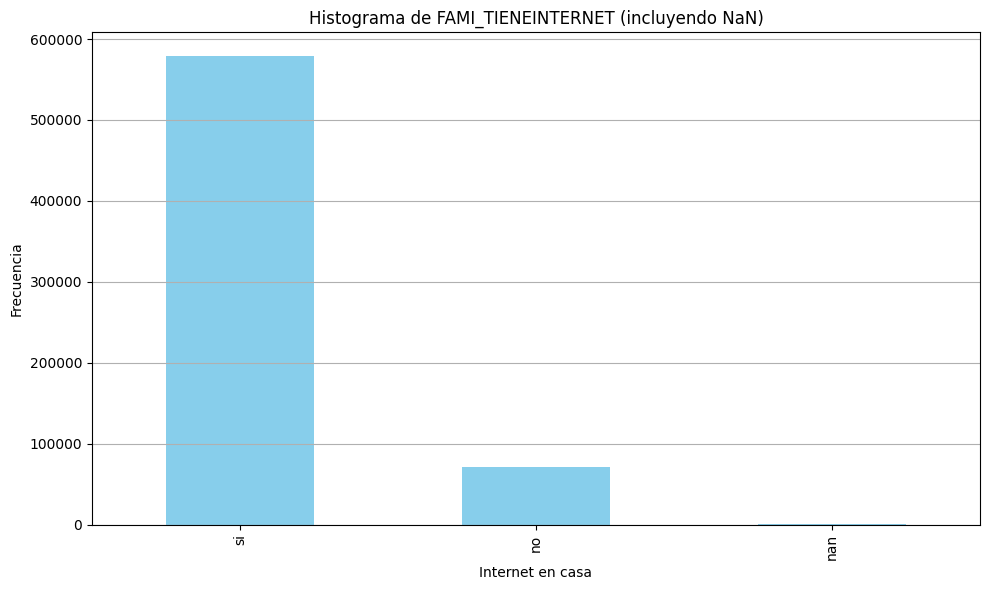

In [70]:
#histograma
plt.figure(figsize=(10, 6))
z_encoded['FAMI_TIENEINTERNET'].value_counts(dropna=False).plot(kind='bar', color='skyblue')
plt.title('Histograma de FAMI_TIENEINTERNET (incluyendo NaN)')
plt.xlabel('Internet en casa')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)
plt.grid(axis='y')

plt.tight_layout()
plt.show()

In [71]:
contar_nulos(z_encoded,'FAMI_TIENEINTERNET')

Total de valores nulos en FAMI_TIENEINTERNET: 836


In [72]:
z = eliminar_filas_nan(z, 'FAMI_TIENEINTERNET')
print(z['FAMI_TIENEINTERNET'].isnull().sum())

Se eliminaron filas de la columna 'FAMI_TIENEINTERNET' con NaN. Porcentaje de NaN: 0.13%
0


In [73]:
z_encoded.FAMI_TIENEINTERNET.value_counts()

,count
FAMI_TIENEINTERNET,
si,579283
no,71056


In [74]:
z = one_hot_encode_column(z,'FAMI_TIENEINTERNET')

## Resultados de la limpieza y presosamiento de datos

In [75]:
column_info = z.dtypes.to_frame(name='Tipo de Dato')
column_info['Cantidad de NaN'] = z.isna().sum()

print(column_info)

                                                   Tipo de Dato  \
ESTU_HORASSEMANATRABAJA                                   int64   
FAMI_ESTRATOVIVIENDA                                      int64   
FAMI_EDUCACIONPADRE                                       int64   
FAMI_EDUCACIONMADRE                                       int64   
RENDIMIENTO_GLOBAL                                        int64   
...                                                         ...   
GRUPO_PRGM_ACADEMICO_traduccion ingles frances ...        int64   
GRUPO_PRGM_ACADEMICO_turismo                              int64   
GRUPO_PRGM_ACADEMICO_urbanismo                            int64   
GRUPO_PRGM_ACADEMICO_zootecnia                            int64   
FAMI_TIENEINTERNET_si                                     int64   

                                                    Cantidad de NaN  
ESTU_HORASSEMANATRABAJA                                           0  
FAMI_ESTRATOVIVIENDA                                   

In [76]:
print ("shape of loaded dataframe", z.shape)

shape of loaded dataframe (650339, 154)


En el proceso de limpieza y preparación de datos, se llevaron a cabo varias técnicas, incluyendo la eliminación de columnas innecesarias, la codificación de etiquetas (label encoding) y la codificación one-hot para variables categóricas. Además, se eliminaron filas con valores nulos, asegurando que el porcentaje de estos no superara el 5%. También se realizaron normalizaciones y agrupaciones de datos para mejorar la calidad y relevancia del conjunto. Como resultado de estas transformaciones, se redujo el conjunto de datos de 692,501 registros  a 650,339  y 12 columnas a 154, optimizando así la información disponible para análisis posteriores.

In [77]:
z.head()

,ESTU_HORASSEMANATRABAJA,FAMI_ESTRATOVIVIENDA,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,RENDIMIENTO_GLOBAL,ESTU_PRGM_DEPARTAMENTO_antioquia,ESTU_PRGM_DEPARTAMENTO_arauca,ESTU_PRGM_DEPARTAMENTO_atlantico,ESTU_PRGM_DEPARTAMENTO_bogota,ESTU_PRGM_DEPARTAMENTO_bolivar,...,GRUPO_PRGM_ACADEMICO_sociologia,GRUPO_PRGM_ACADEMICO_teatro musical,GRUPO_PRGM_ACADEMICO_teologia,GRUPO_PRGM_ACADEMICO_terapia,GRUPO_PRGM_ACADEMICO_trabajo social,GRUPO_PRGM_ACADEMICO_traduccion ingles frances espanol,GRUPO_PRGM_ACADEMICO_turismo,GRUPO_PRGM_ACADEMICO_urbanismo,GRUPO_PRGM_ACADEMICO_zootecnia,FAMI_TIENEINTERNET_si
0,5,2,11,5,2,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,2,10,11,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,35,2,8,8,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
3,0,3,4,8,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,25,2,6,6,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
